In [38]:
import pathlib

# Define data directory
train_dir = pathlib.Path('data/train')
test_dir = pathlib.Path('data/test')
train_masks_dir = pathlib.Path('external_contours_masks/train')
test_masks_dir = pathlib.Path('external_contours_masks/test')

In [39]:
# Convert all the images in train masks and test masks to png
import os
from PIL import Image

for img_path in train_masks_dir.glob('*.jpg'):
    os.remove(img_path)

for img_path in test_masks_dir.glob('*.jpg'):
    os.remove(img_path)

In [40]:
import os
import cv2
import numpy as np

# check if the pixels are normalized
img = cv2.imread(os.path.join(test_dir, 'P1MF1_C.Png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img), np.min(img))
img_mask = cv2.imread(os.path.join(test_masks_dir, 'P1MF1_C.Png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img_mask), np.min(img_mask))
print(img.shape, img_mask.shape)

255 0
233 0
(4096, 4096) (4096, 4096)


In [41]:
X_train = []
y_train = []
X_test = []
y_test = []

for img_path in train_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_train.append(img)
    mask_path = os.path.join(train_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_train.append(img_mask)

for img_path in test_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_test.append(img)
    mask_path = os.path.join(test_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_test.append(img_mask)

X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

# # Expand the dimensions of the images
#X_train = np.expand_dims(X_train, axis = 3)
y_train = np.expand_dims(y_train, axis = 3)
#X_test = np.expand_dims(X_test, axis = 3)
y_test = np.expand_dims(y_test, axis = 3)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(50, 256, 256, 3) (50, 256, 256, 1)
(13, 256, 256, 3) (13, 256, 256, 1)


In [42]:
import tensorflow as tf

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

In [43]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask = tf.round(tf.cast(input_mask, tf.float32) / 255.0)
    return input_image, input_mask

def load_image(input_image, input_mask):
    input_image = tf.image.resize(input_image, (128, 128))
    input_mask = tf.image.resize(input_mask,(128, 128), method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

In [44]:
TRAIN_LENGTH = len(X_train)
BATCH_SIZE = 8
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [45]:
train_ds = train_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_ds = test_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

print("the shape of the train dataset is: ", train_ds)
# Show the labels of the first image
for image, mask in train_ds.take(1):
    print(" median value of the image is: ", np.median(mask.numpy()))
    # print("the shape of the image is: ", image.numpy().shape)
    # print("the shape of the mask is: ", mask.numpy().shape)
    # print("the label of the first image is: ", mask.numpy())

the shape of the train dataset is:  <_ParallelMapDataset element_spec=(TensorSpec(shape=(128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(128, 128, 1), dtype=tf.float32, name=None))>
 median value of the image is:  1.0


In [46]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    # both use the same seed, so they'll make the same random changes.
    # do augmentation in ratio of 1 to 5 images in the train
    self.augment_inputs = tf.keras.Sequential([
        tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
        tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
        tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2, seed=seed),
        tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2, seed=seed),
        tf.keras.layers.RandomContrast(factor=0.2, seed=seed),
    ], name="augment_inputs")

    self.augment_labels = tf.keras.Sequential([
        tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
        tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
        tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2, seed=seed),
        tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2, seed=seed),
    ], name="augment_labels")

  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


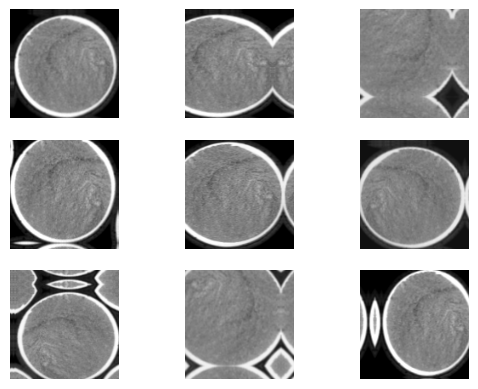

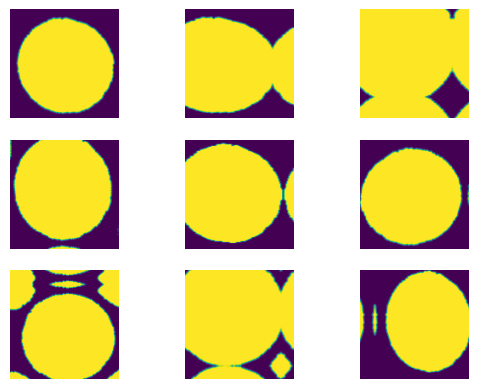

In [47]:
from matplotlib import pyplot as plt
# plot 9 augmentations of the image and the mask for one original image and its mask
for image, mask in train_ds.take(1):
    # random seed array
    seed = np.random.randint(0, 1000, 9)
    for i in range(9):
        plt.subplot(330 + 1 + i)
        augmented_image, augmented_mask = Augment(seed[i])(image, mask)
        plt.imshow(augmented_image.numpy())
        plt.axis("off")
    plt.show()
    for i in range(9):
        plt.subplot(330 + 1 + i)
        augmented_image, augmented_mask = Augment(seed[i])(image, mask)
        plt.imshow(augmented_mask.numpy())
        plt.axis("off")
    plt.show()

In [48]:
train_batches = (
    train_ds
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_ds.batch(BATCH_SIZE)

In [49]:
from matplotlib import pyplot as plt

def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    # print the unique values of the image
    #print(np.unique(display_list[i]))
    plt.axis('off')
  plt.show()

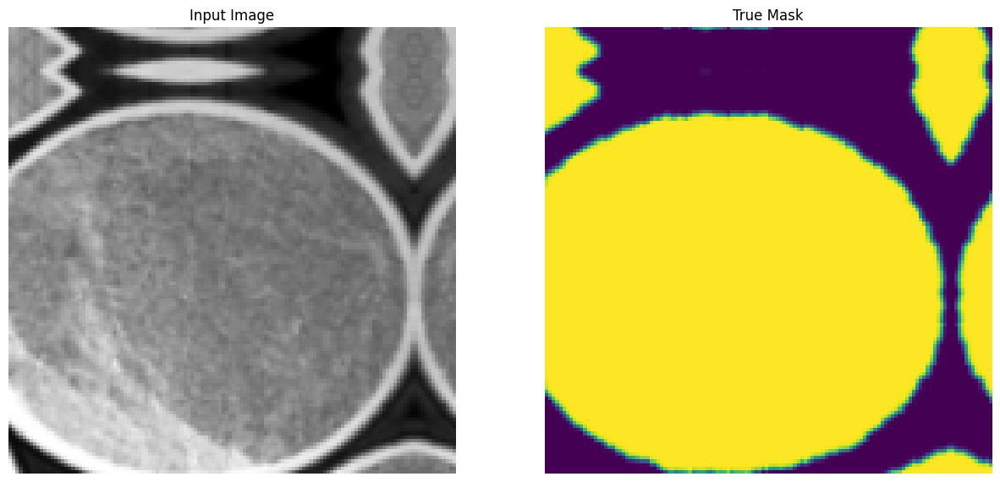

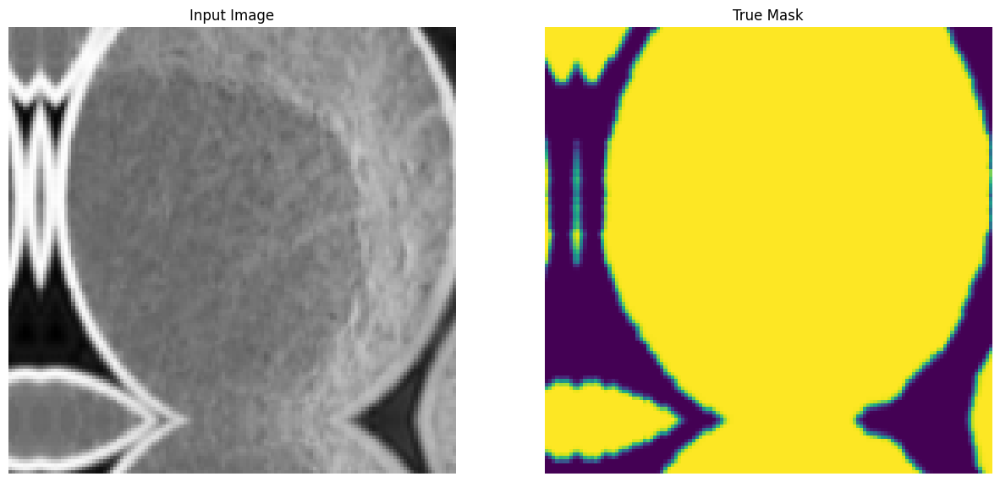

In [50]:
for images, masks in train_batches.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

In [51]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

# Make the last two layers trainable, but keep the rest frozen
for layer in down_stack.layers:  # Exclude the last two layers
    layer.trainable = False

# # Now, set the last two layers to be trainable
# for layer in down_stack.layers[-1:]:
#     layer.trainable = True

In [52]:
from tensorflow_examples.models.pix2pix import pix2pix

up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
    pix2pix.upsample(32, 3),   # 64x64 -> 128x128
]

# Make the last two layers of the up_stack trainable, but keep the rest frozen
# for layer in up_stack[0:0]:  # Exclude the last two layers
#     layer.trainable = False

# # Now, set the last two layers to be trainable
for layer in up_stack:
    layer.trainable = True


In [53]:
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [54]:
# Try the model
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [55]:
class WeightedSCCE(tf.keras.losses.Loss):
    def __init__(self, class_weight, from_logits=False, name='weighted_scce'):
        if class_weight is None or all(v == 1. for v in class_weight):
            self.class_weight = None
        else:
            self.class_weight = tf.convert_to_tensor(class_weight,
                dtype=tf.float32)
        self.name = name
        self.reduction = tf.keras.losses.Reduction.NONE
        self.unreduced_scce = tf.keras.losses.SparseCategoricalCrossentropy(
            from_logits=from_logits, name=name,
            reduction=self.reduction)

    def __call__(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, dtype=tf.int32)
        loss = self.unreduced_scce(y_true, y_pred, sample_weight)
        if self.class_weight is not None:
            weight_mask = tf.gather(self.class_weight, y_true)
            loss = tf.math.multiply(loss, weight_mask)
        return loss


In [56]:
import tensorflow as tf
# Assuming OUTPUT_CLASSES is the number of classes in your segmentation task
OUTPUT_CLASSES = 2

# Create the U-Net model
model = unet_model(output_channels=OUTPUT_CLASSES)

# Compile the model
model.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [57]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 [==============================] - 1s 777ms/step


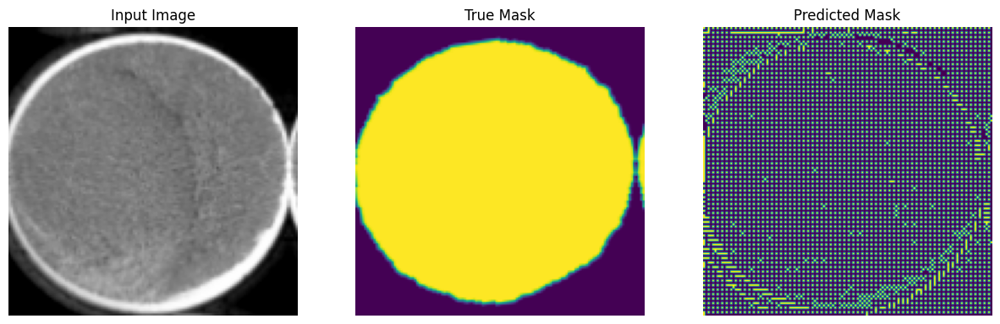

1/1 [==============================] - 0s 175ms/step


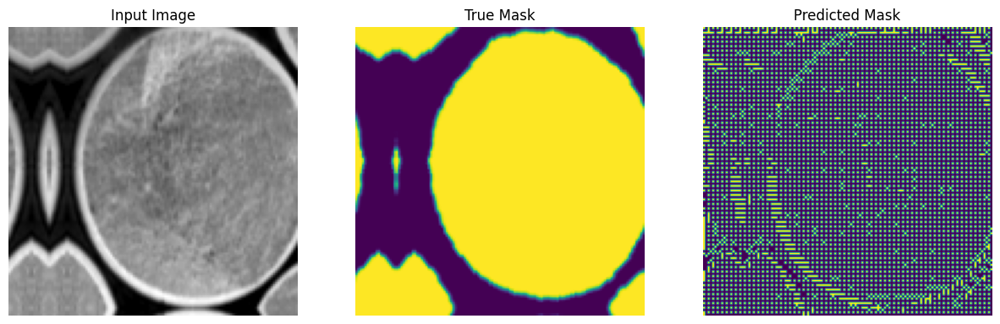

1/1 [==============================] - 0s 207ms/step


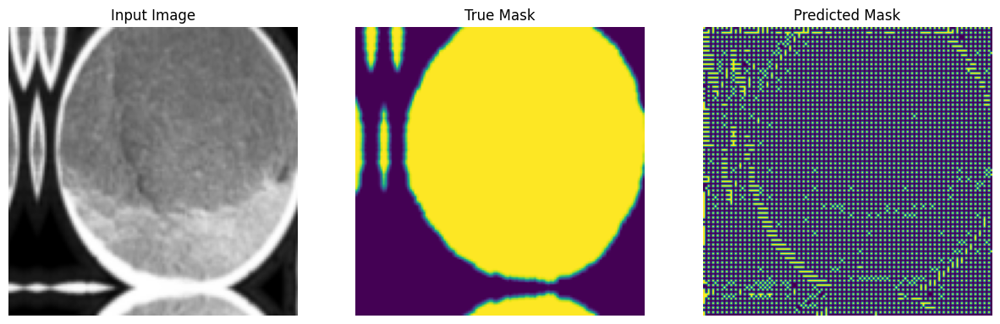

In [58]:
show_predictions(train_batches, 3)

In [59]:
from IPython.display import clear_output

class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    #clear_output(wait=True)
    show_predictions(train_batches, 1)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/200
1/1 [==============================] - 0s 144ms/step


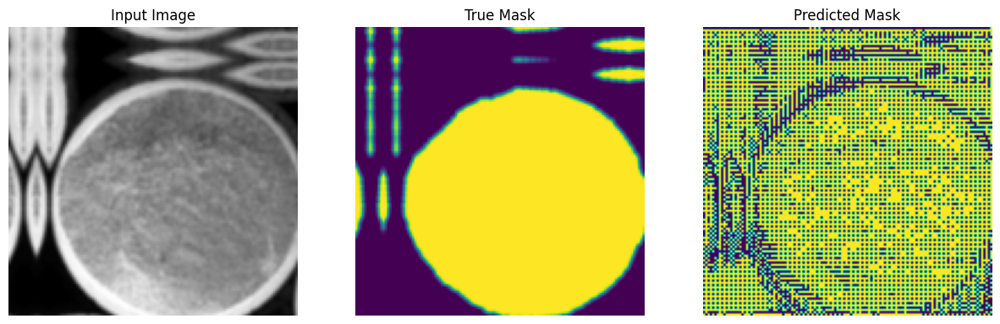


Sample Prediction after epoch 1

6/6 [==============================] - 6s 591ms/step - loss: 0.6860 - accuracy: 0.5738 - val_loss: 0.6471 - val_accuracy: 0.6439
Epoch 2/200
1/1 [==============================] - 0s 144ms/step


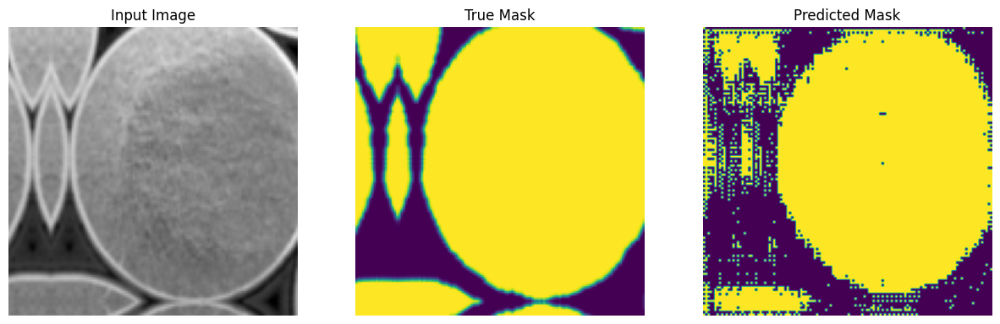


Sample Prediction after epoch 2

6/6 [==============================] - 2s 433ms/step - loss: 0.3972 - accuracy: 0.7512 - val_loss: 0.3246 - val_accuracy: 0.9083
Epoch 3/200
1/1 [==============================] - 0s 142ms/step


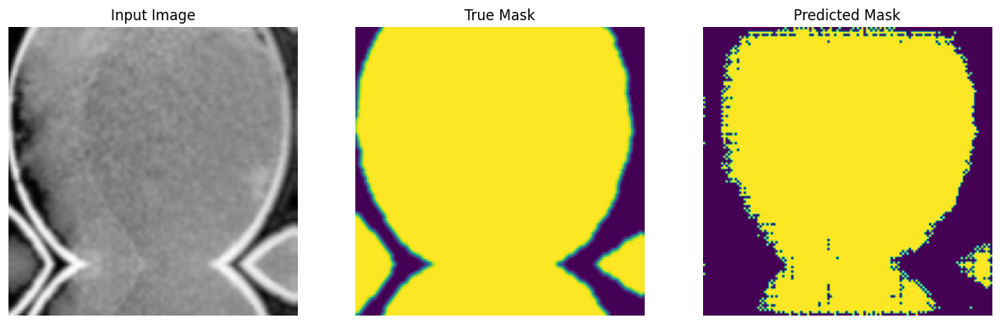


Sample Prediction after epoch 3

6/6 [==============================] - 2s 372ms/step - loss: 0.2659 - accuracy: 0.8381 - val_loss: 0.2236 - val_accuracy: 0.9360
Epoch 4/200
1/1 [==============================] - 0s 134ms/step


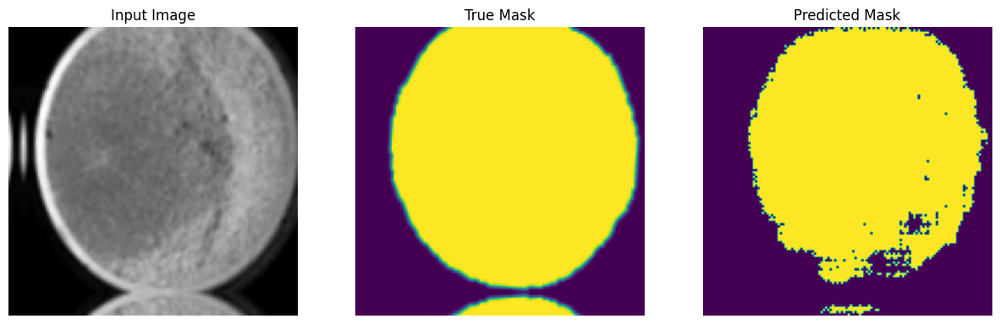


Sample Prediction after epoch 4

6/6 [==============================] - 2s 374ms/step - loss: 0.1966 - accuracy: 0.8526 - val_loss: 0.2420 - val_accuracy: 0.9280
Epoch 5/200
1/1 [==============================] - 0s 151ms/step


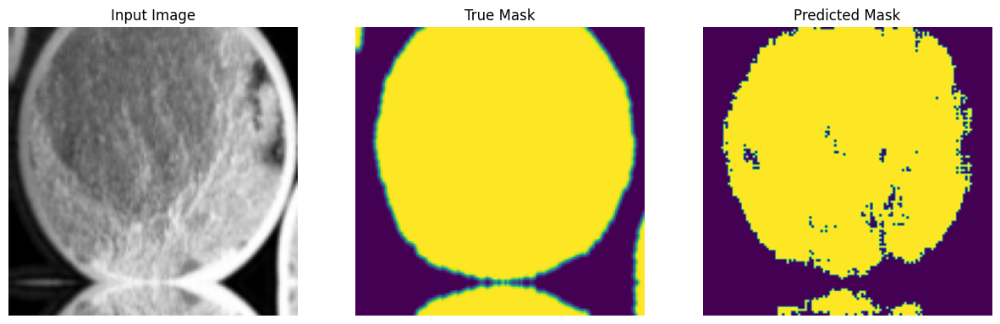


Sample Prediction after epoch 5

6/6 [==============================] - 2s 377ms/step - loss: 0.1510 - accuracy: 0.8659 - val_loss: 0.2009 - val_accuracy: 0.9409
Epoch 6/200
1/1 [==============================] - 0s 153ms/step


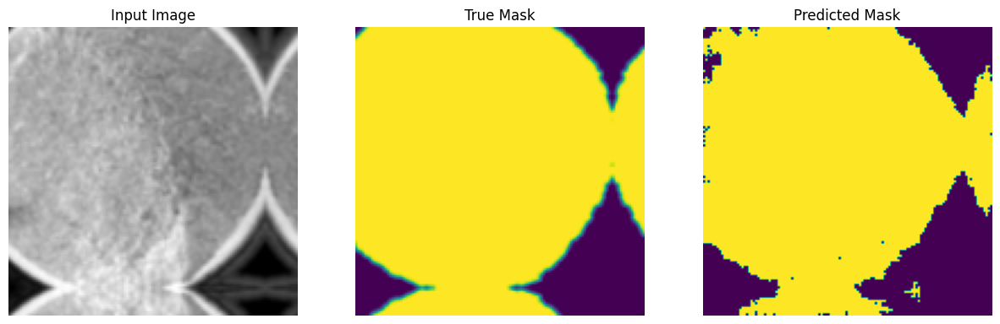


Sample Prediction after epoch 6

6/6 [==============================] - 2s 380ms/step - loss: 0.1255 - accuracy: 0.8701 - val_loss: 0.1645 - val_accuracy: 0.9509
Epoch 7/200
1/1 [==============================] - 0s 142ms/step


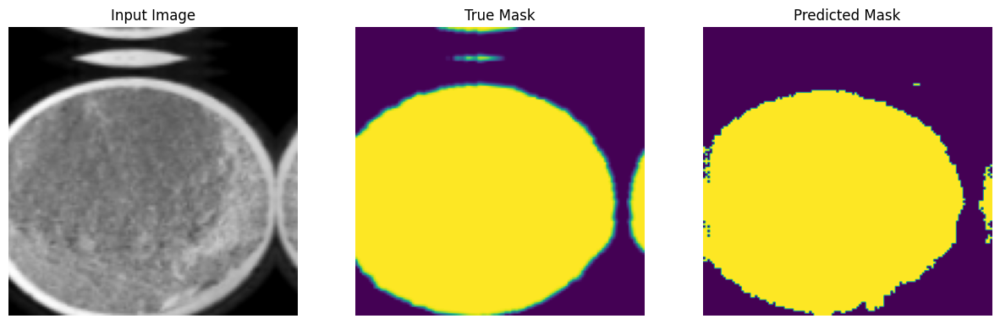


Sample Prediction after epoch 7

6/6 [==============================] - 2s 376ms/step - loss: 0.1090 - accuracy: 0.8723 - val_loss: 0.1355 - val_accuracy: 0.9580
Epoch 8/200
1/1 [==============================] - 0s 143ms/step


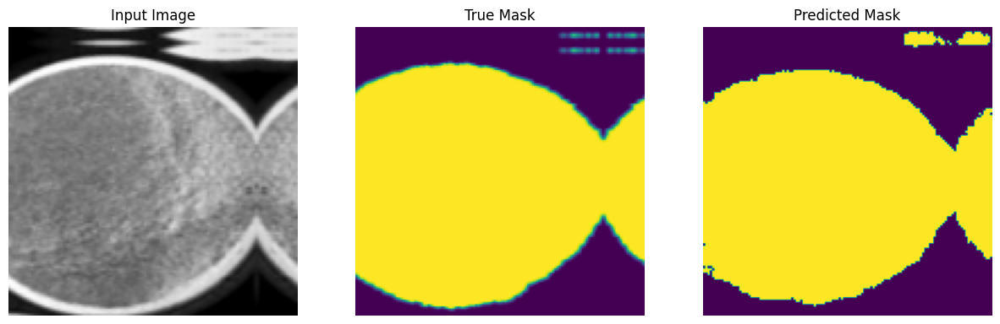


Sample Prediction after epoch 8

6/6 [==============================] - 3s 453ms/step - loss: 0.1074 - accuracy: 0.8674 - val_loss: 0.1530 - val_accuracy: 0.9535
Epoch 9/200
1/1 [==============================] - 0s 160ms/step


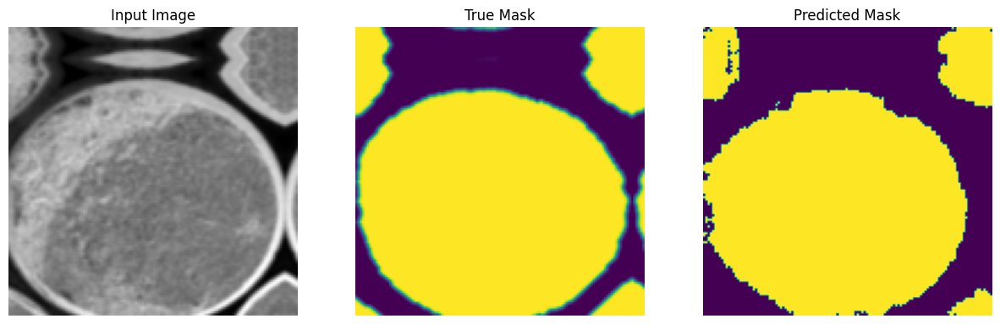


Sample Prediction after epoch 9

6/6 [==============================] - 3s 502ms/step - loss: 0.0975 - accuracy: 0.8748 - val_loss: 0.1466 - val_accuracy: 0.9548
Epoch 10/200
1/1 [==============================] - 0s 142ms/step


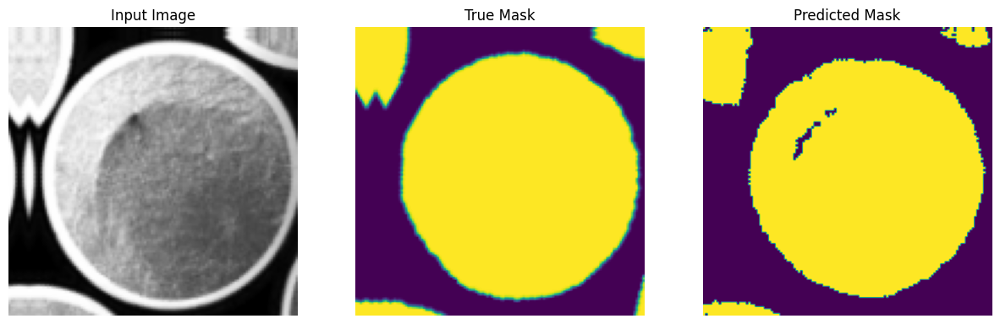


Sample Prediction after epoch 10

6/6 [==============================] - 3s 464ms/step - loss: 0.1017 - accuracy: 0.8611 - val_loss: 0.1323 - val_accuracy: 0.9579
Epoch 11/200
1/1 [==============================] - 0s 158ms/step


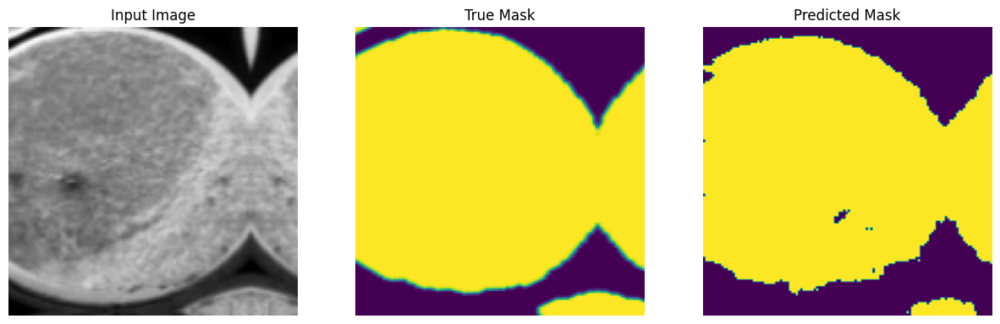


Sample Prediction after epoch 11

6/6 [==============================] - 3s 477ms/step - loss: 0.0908 - accuracy: 0.8673 - val_loss: 0.1449 - val_accuracy: 0.9553
Epoch 12/200
1/1 [==============================] - 0s 142ms/step


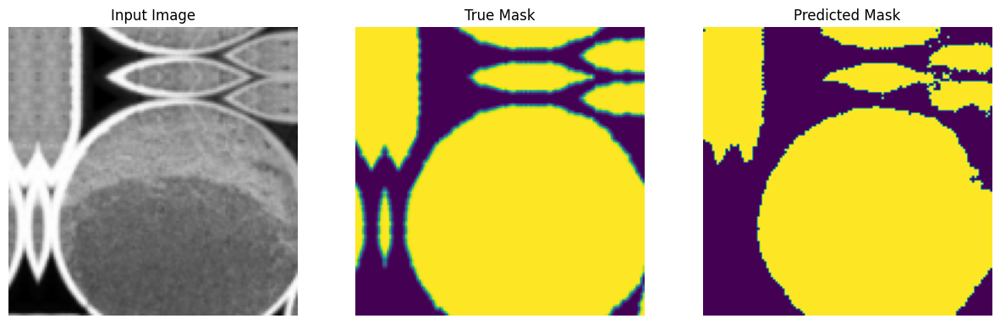


Sample Prediction after epoch 12

6/6 [==============================] - 3s 461ms/step - loss: 0.0946 - accuracy: 0.8746 - val_loss: 0.1451 - val_accuracy: 0.9560
Epoch 13/200
1/1 [==============================] - 0s 159ms/step


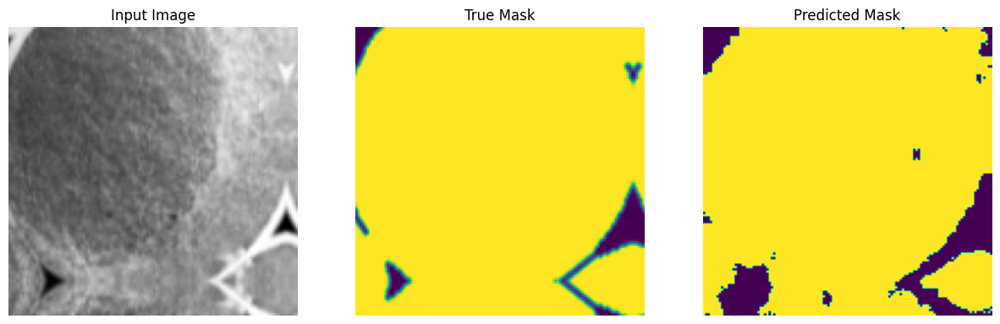


Sample Prediction after epoch 13

6/6 [==============================] - 3s 467ms/step - loss: 0.0959 - accuracy: 0.8738 - val_loss: 0.1421 - val_accuracy: 0.9565
Epoch 14/200
1/1 [==============================] - 0s 150ms/step


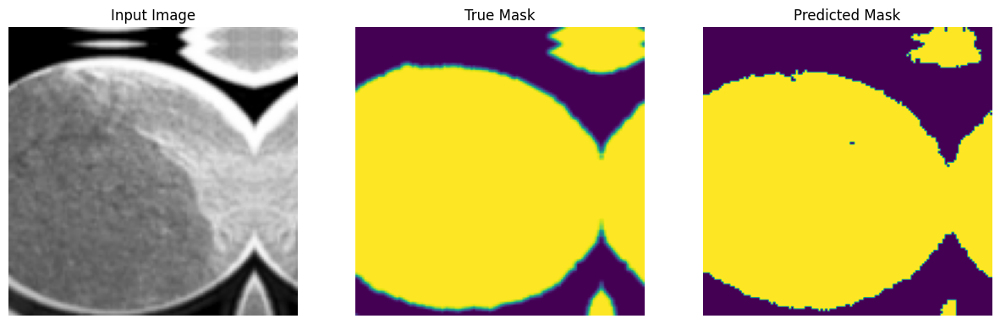


Sample Prediction after epoch 14

6/6 [==============================] - 3s 467ms/step - loss: 0.0982 - accuracy: 0.8703 - val_loss: 0.1039 - val_accuracy: 0.9647
Epoch 15/200
1/1 [==============================] - 0s 158ms/step


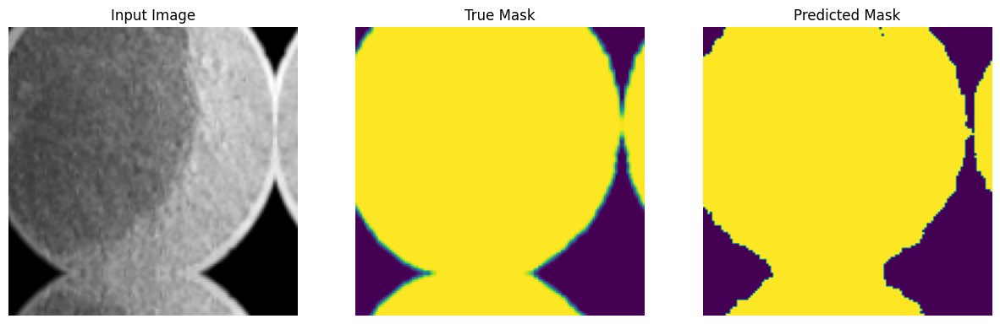


Sample Prediction after epoch 15

6/6 [==============================] - 3s 500ms/step - loss: 0.0867 - accuracy: 0.8678 - val_loss: 0.1021 - val_accuracy: 0.9636
Epoch 16/200
1/1 [==============================] - 0s 158ms/step


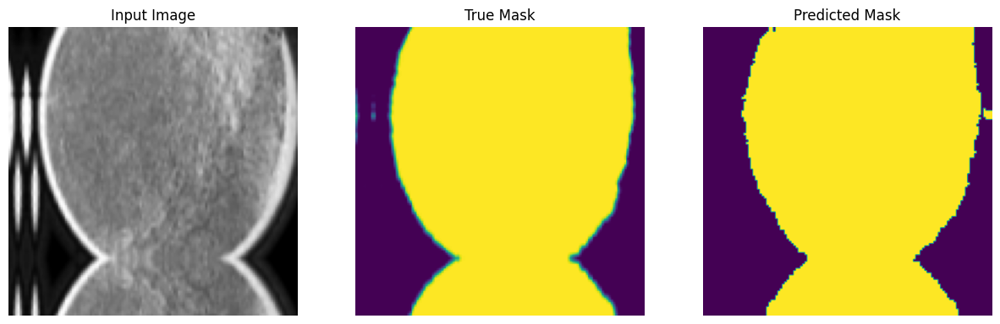


Sample Prediction after epoch 16

6/6 [==============================] - 3s 499ms/step - loss: 0.0835 - accuracy: 0.8755 - val_loss: 0.0972 - val_accuracy: 0.9650
Epoch 17/200
1/1 [==============================] - 0s 148ms/step


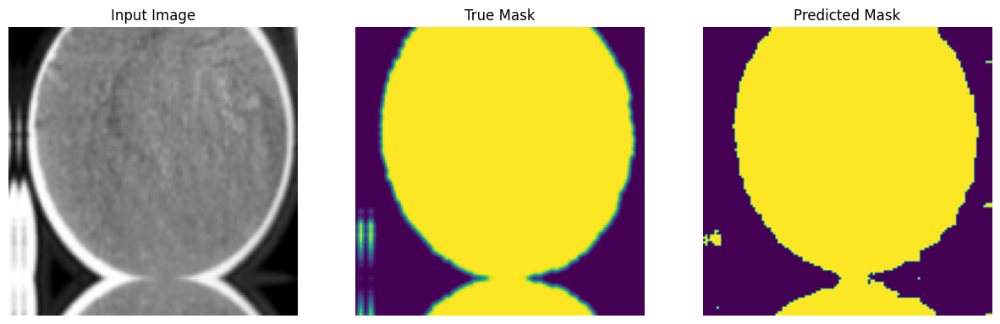


Sample Prediction after epoch 17

6/6 [==============================] - 3s 458ms/step - loss: 0.0763 - accuracy: 0.8788 - val_loss: 0.1111 - val_accuracy: 0.9631
Epoch 18/200
1/1 [==============================] - 0s 158ms/step


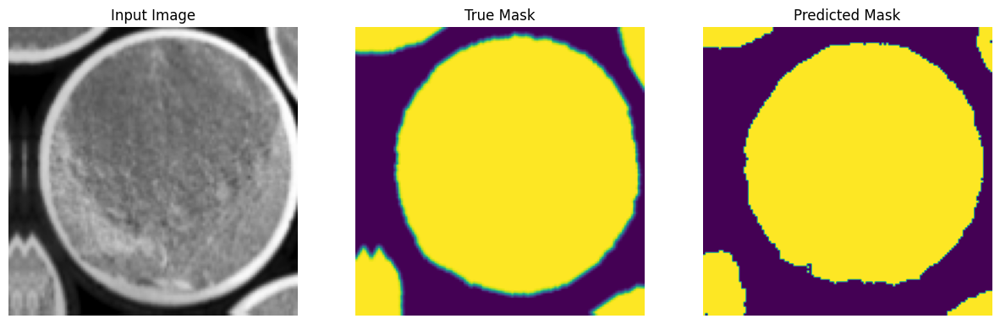


Sample Prediction after epoch 18

6/6 [==============================] - 3s 459ms/step - loss: 0.0817 - accuracy: 0.8755 - val_loss: 0.1201 - val_accuracy: 0.9603
Epoch 19/200
1/1 [==============================] - 0s 159ms/step


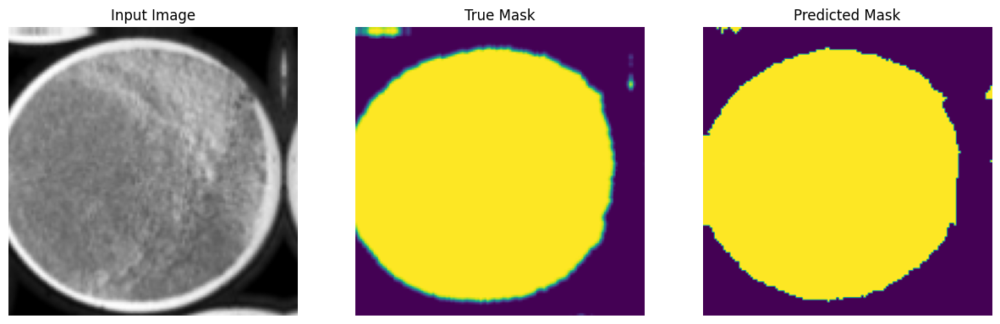


Sample Prediction after epoch 19

6/6 [==============================] - 3s 535ms/step - loss: 0.0728 - accuracy: 0.8763 - val_loss: 0.0981 - val_accuracy: 0.9658
Epoch 20/200
1/1 [==============================] - 0s 161ms/step


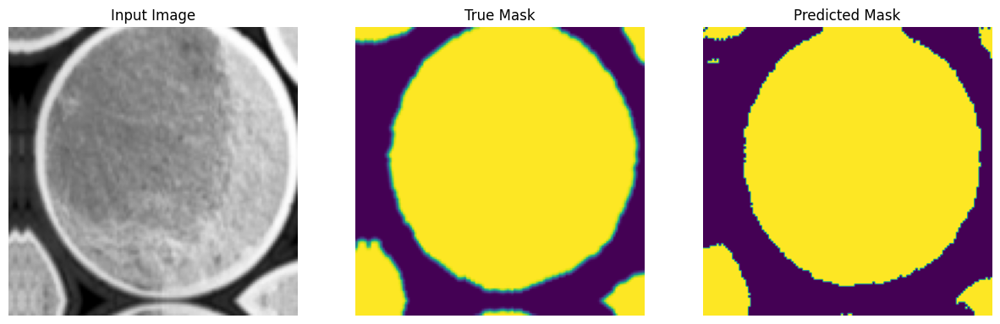


Sample Prediction after epoch 20

6/6 [==============================] - 3s 454ms/step - loss: 0.0729 - accuracy: 0.8860 - val_loss: 0.1024 - val_accuracy: 0.9645
Epoch 21/200
1/1 [==============================] - 0s 158ms/step


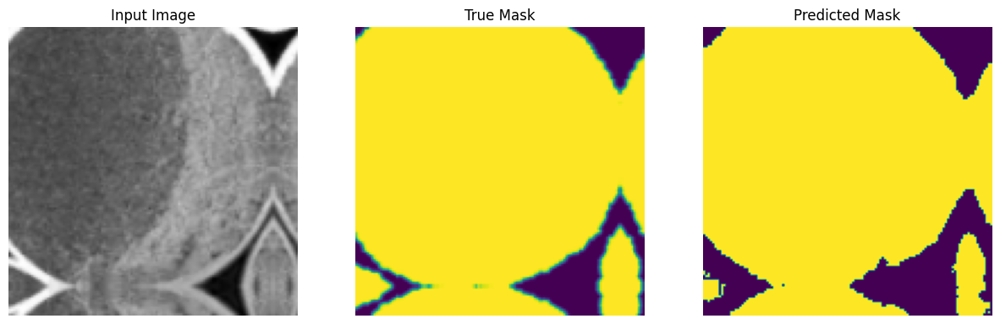


Sample Prediction after epoch 21

6/6 [==============================] - 3s 468ms/step - loss: 0.0817 - accuracy: 0.8687 - val_loss: 0.0953 - val_accuracy: 0.9660
Epoch 22/200
1/1 [==============================] - 0s 158ms/step


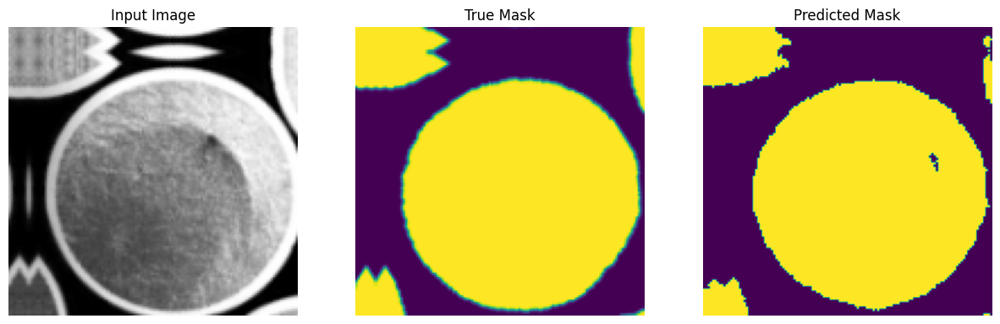


Sample Prediction after epoch 22

6/6 [==============================] - 3s 501ms/step - loss: 0.0771 - accuracy: 0.8720 - val_loss: 0.0912 - val_accuracy: 0.9671
Epoch 23/200
1/1 [==============================] - 0s 170ms/step


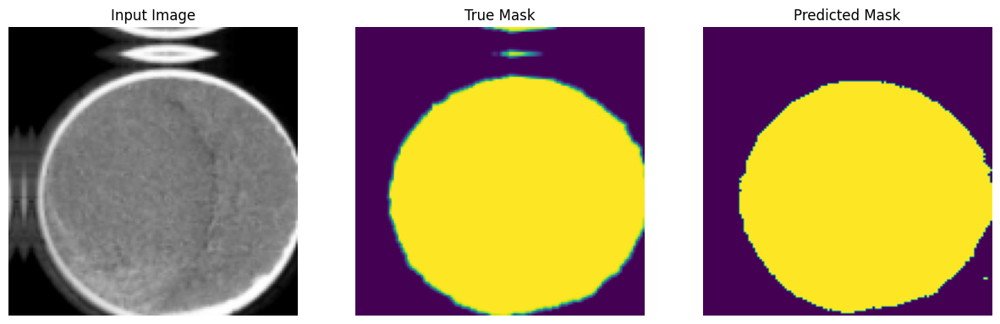


Sample Prediction after epoch 23

6/6 [==============================] - 3s 499ms/step - loss: 0.0735 - accuracy: 0.8618 - val_loss: 0.0908 - val_accuracy: 0.9668
Epoch 24/200
1/1 [==============================] - 0s 153ms/step


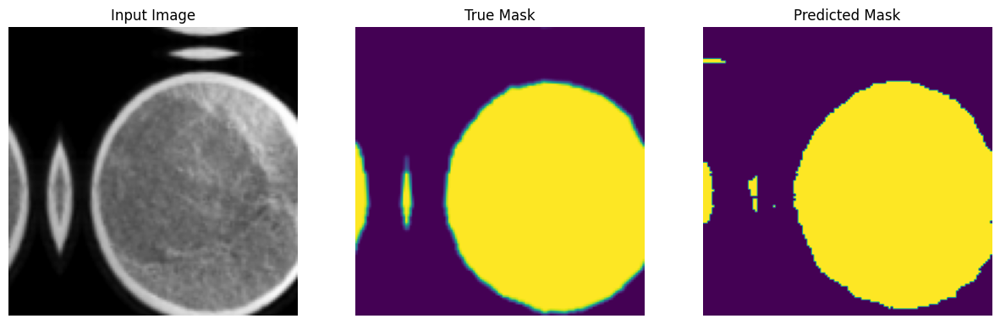


Sample Prediction after epoch 24

6/6 [==============================] - 3s 465ms/step - loss: 0.0761 - accuracy: 0.8679 - val_loss: 0.0803 - val_accuracy: 0.9703
Epoch 25/200
1/1 [==============================] - 0s 151ms/step


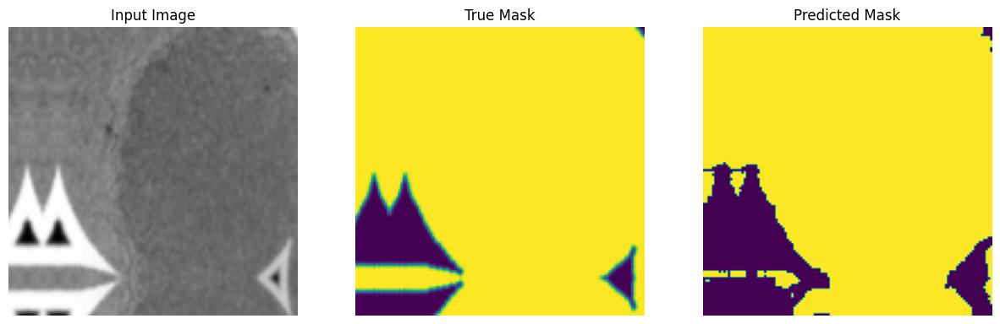


Sample Prediction after epoch 25

6/6 [==============================] - 3s 474ms/step - loss: 0.0687 - accuracy: 0.8824 - val_loss: 0.0891 - val_accuracy: 0.9682
Epoch 26/200
1/1 [==============================] - 0s 158ms/step


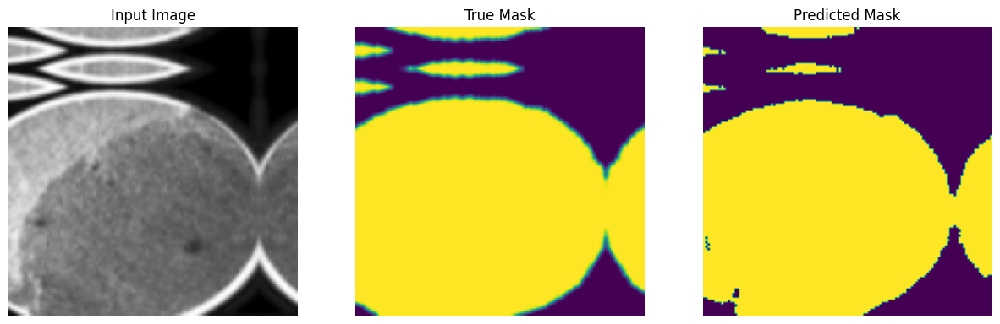


Sample Prediction after epoch 26

6/6 [==============================] - 3s 462ms/step - loss: 0.0731 - accuracy: 0.8728 - val_loss: 0.1135 - val_accuracy: 0.9614
Epoch 27/200
1/1 [==============================] - 0s 163ms/step


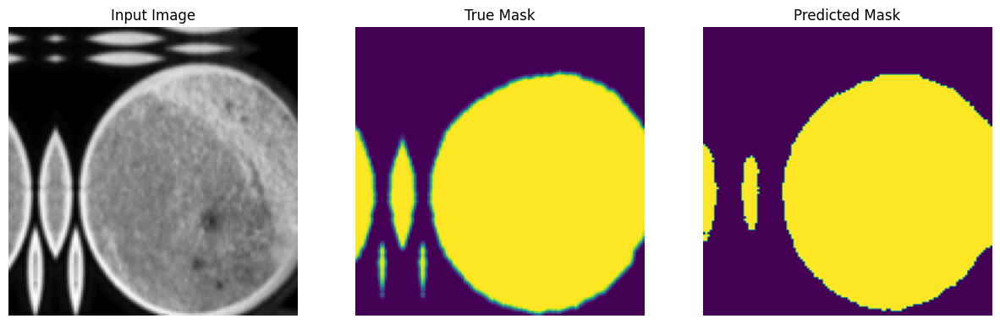


Sample Prediction after epoch 27

6/6 [==============================] - 3s 494ms/step - loss: 0.0668 - accuracy: 0.8800 - val_loss: 0.0851 - val_accuracy: 0.9689
Epoch 28/200
1/1 [==============================] - 0s 174ms/step


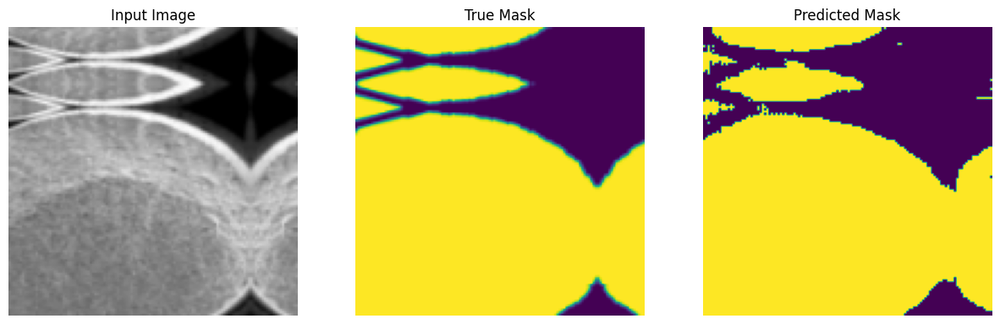


Sample Prediction after epoch 28

6/6 [==============================] - 3s 457ms/step - loss: 0.0778 - accuracy: 0.8738 - val_loss: 0.0858 - val_accuracy: 0.9686
Epoch 29/200
1/1 [==============================] - 0s 163ms/step


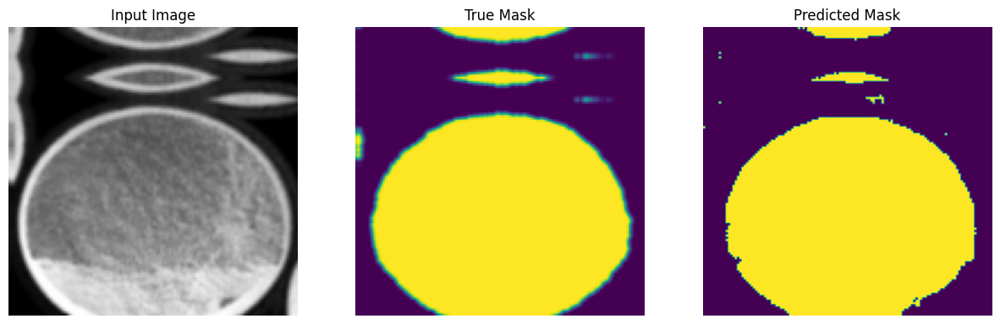


Sample Prediction after epoch 29

6/6 [==============================] - 3s 514ms/step - loss: 0.0715 - accuracy: 0.8699 - val_loss: 0.0862 - val_accuracy: 0.9682
Epoch 30/200
1/1 [==============================] - 0s 158ms/step


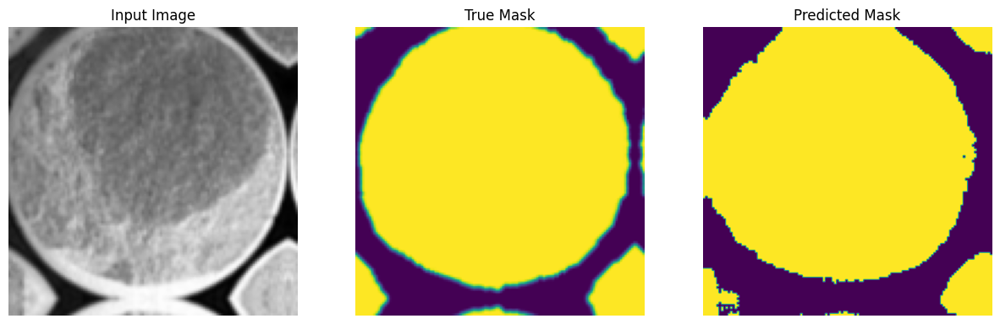


Sample Prediction after epoch 30

6/6 [==============================] - 3s 511ms/step - loss: 0.0760 - accuracy: 0.8645 - val_loss: 0.0765 - val_accuracy: 0.9714
Epoch 31/200
1/1 [==============================] - 0s 152ms/step


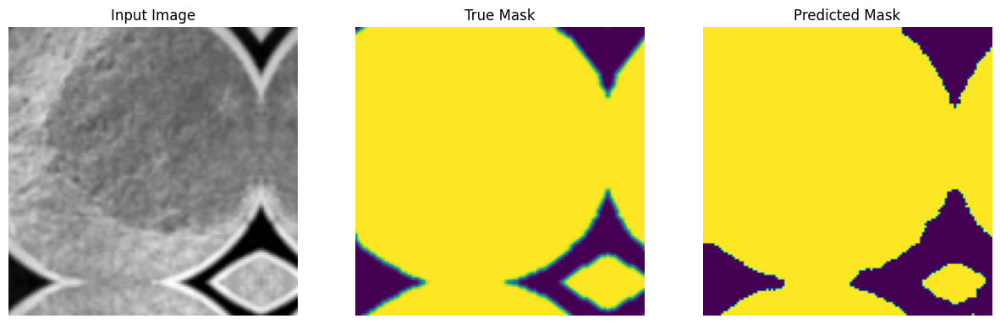


Sample Prediction after epoch 31

6/6 [==============================] - 3s 471ms/step - loss: 0.0722 - accuracy: 0.8776 - val_loss: 0.0915 - val_accuracy: 0.9671
Epoch 32/200
1/1 [==============================] - 0s 169ms/step


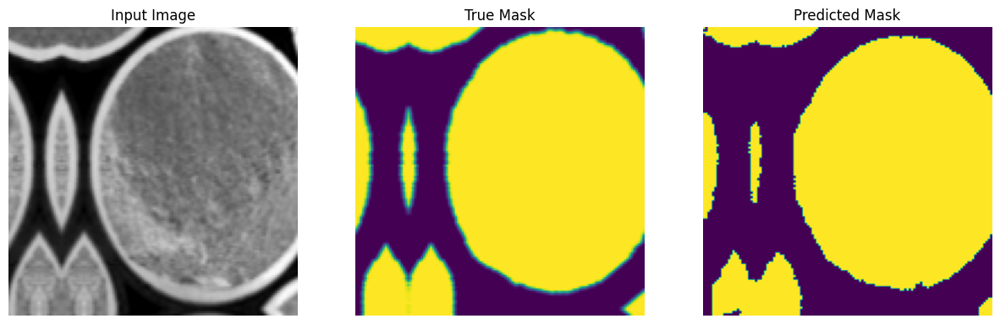


Sample Prediction after epoch 32

6/6 [==============================] - 3s 503ms/step - loss: 0.0699 - accuracy: 0.8764 - val_loss: 0.0743 - val_accuracy: 0.9726
Epoch 33/200
1/1 [==============================] - 0s 158ms/step


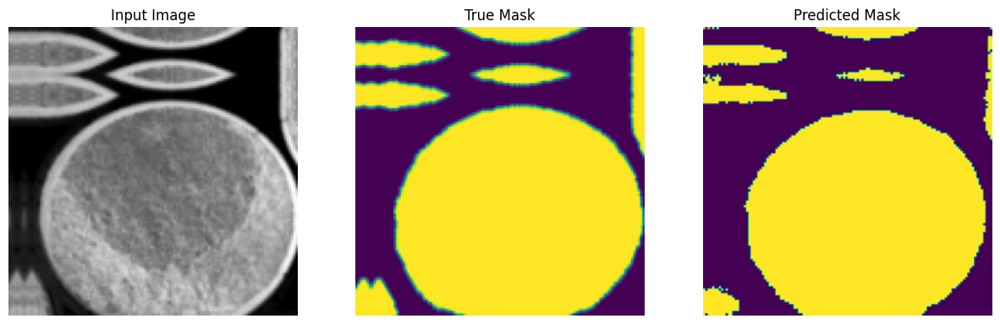


Sample Prediction after epoch 33

6/6 [==============================] - 3s 467ms/step - loss: 0.0773 - accuracy: 0.8722 - val_loss: 0.0834 - val_accuracy: 0.9695
Epoch 34/200
1/1 [==============================] - 0s 163ms/step


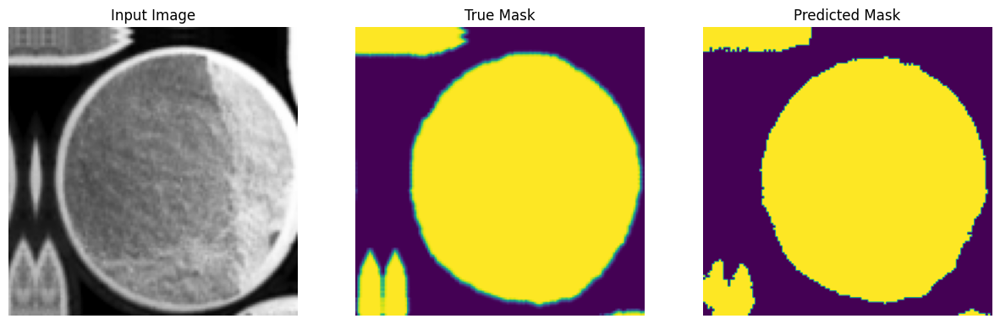


Sample Prediction after epoch 34

6/6 [==============================] - 3s 507ms/step - loss: 0.0704 - accuracy: 0.8776 - val_loss: 0.0871 - val_accuracy: 0.9686
Epoch 35/200
1/1 [==============================] - 0s 164ms/step


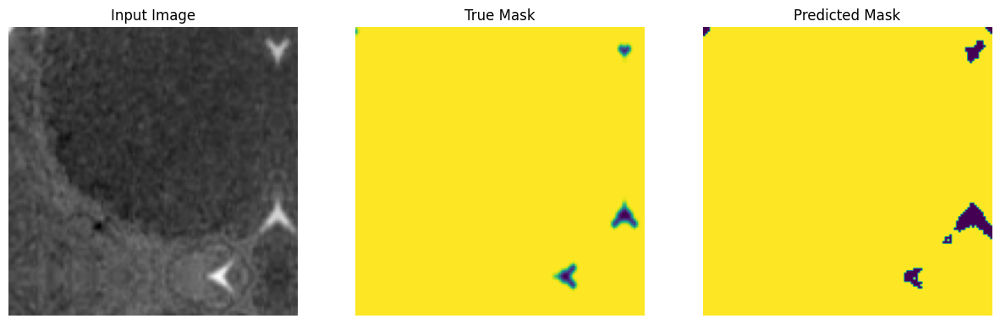


Sample Prediction after epoch 35

6/6 [==============================] - 3s 473ms/step - loss: 0.0722 - accuracy: 0.8771 - val_loss: 0.0947 - val_accuracy: 0.9662
Epoch 36/200
1/1 [==============================] - 0s 157ms/step


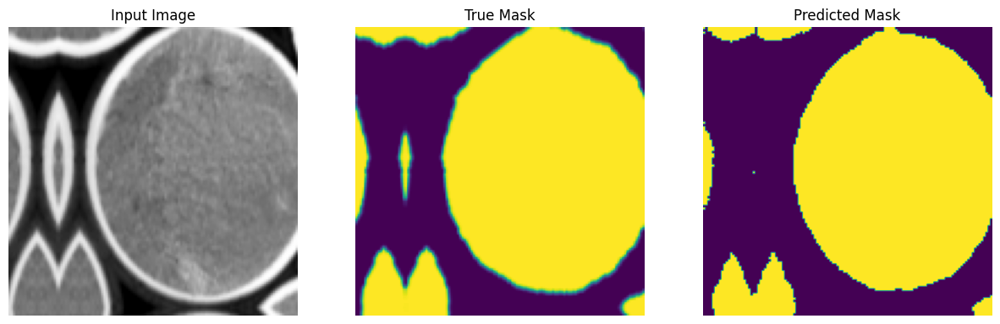


Sample Prediction after epoch 36

6/6 [==============================] - 3s 504ms/step - loss: 0.0754 - accuracy: 0.8685 - val_loss: 0.0746 - val_accuracy: 0.9722
Epoch 37/200
1/1 [==============================] - 0s 153ms/step


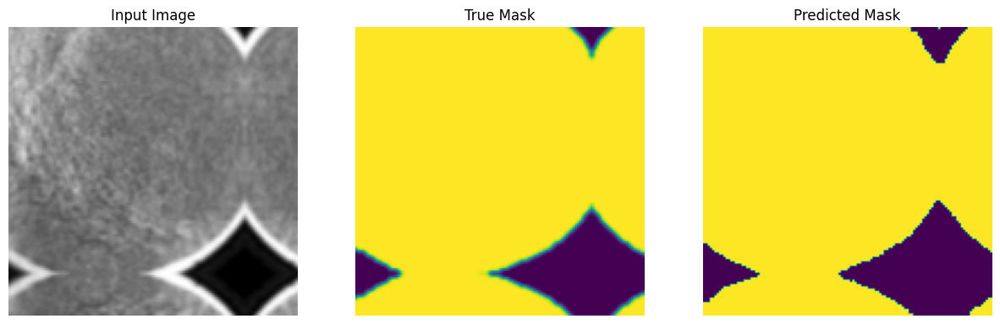


Sample Prediction after epoch 37

6/6 [==============================] - 3s 511ms/step - loss: 0.0680 - accuracy: 0.8814 - val_loss: 0.0716 - val_accuracy: 0.9731
Epoch 38/200
1/1 [==============================] - 0s 167ms/step


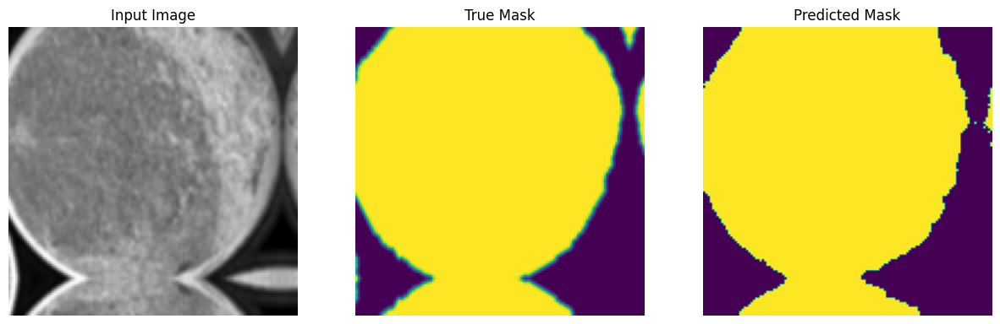


Sample Prediction after epoch 38

6/6 [==============================] - 3s 477ms/step - loss: 0.0633 - accuracy: 0.8786 - val_loss: 0.0886 - val_accuracy: 0.9669
Epoch 39/200
1/1 [==============================] - 0s 158ms/step


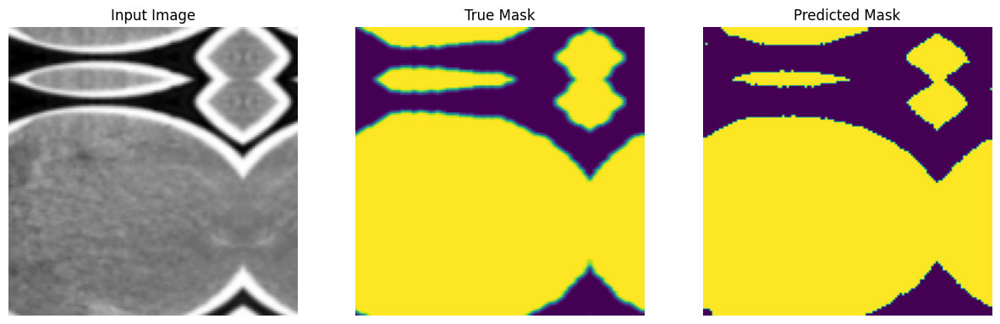


Sample Prediction after epoch 39

6/6 [==============================] - 3s 466ms/step - loss: 0.0646 - accuracy: 0.8769 - val_loss: 0.0860 - val_accuracy: 0.9682
Epoch 40/200
1/1 [==============================] - 0s 171ms/step


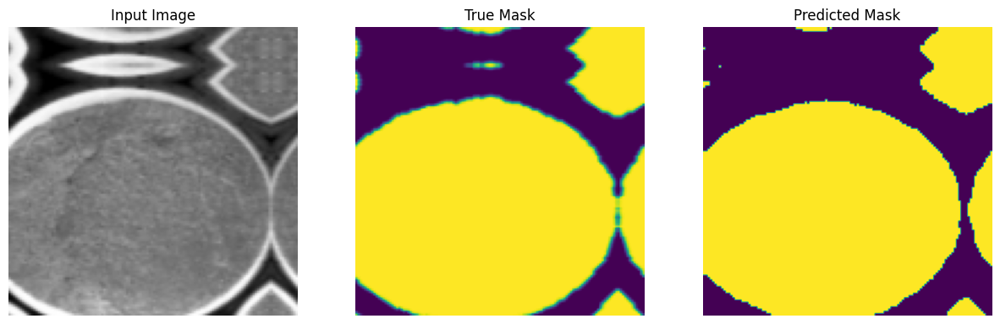


Sample Prediction after epoch 40

6/6 [==============================] - 3s 475ms/step - loss: 0.0681 - accuracy: 0.8762 - val_loss: 0.0812 - val_accuracy: 0.9699
Epoch 41/200
1/1 [==============================] - 0s 159ms/step


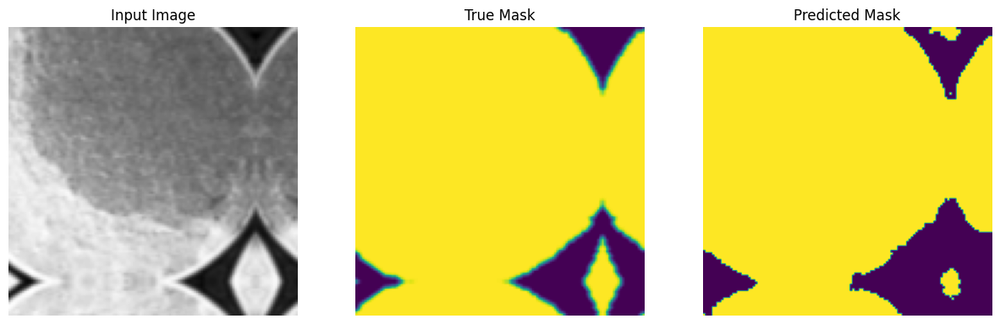


Sample Prediction after epoch 41

6/6 [==============================] - 3s 505ms/step - loss: 0.0638 - accuracy: 0.8834 - val_loss: 0.0909 - val_accuracy: 0.9662
Epoch 42/200
1/1 [==============================] - 0s 149ms/step


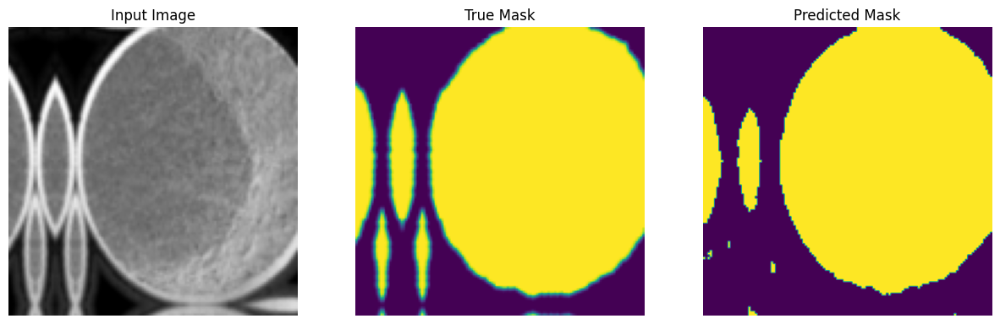


Sample Prediction after epoch 42

6/6 [==============================] - 3s 467ms/step - loss: 0.0687 - accuracy: 0.8759 - val_loss: 0.0989 - val_accuracy: 0.9642
Epoch 43/200
1/1 [==============================] - 0s 148ms/step


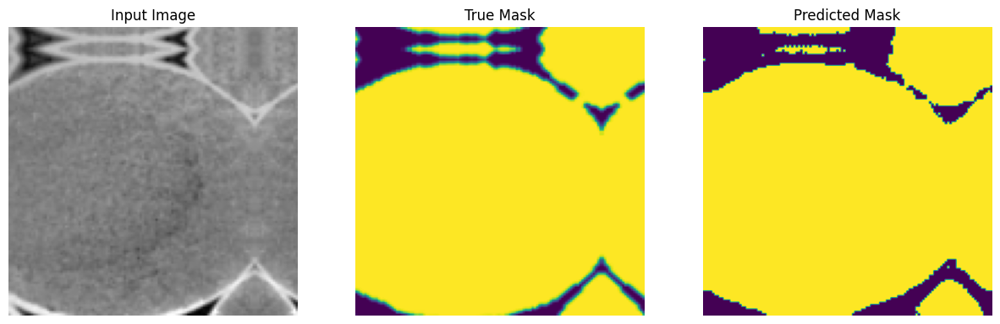


Sample Prediction after epoch 43

6/6 [==============================] - 3s 557ms/step - loss: 0.0664 - accuracy: 0.8745 - val_loss: 0.0844 - val_accuracy: 0.9688
Epoch 44/200
1/1 [==============================] - 0s 142ms/step


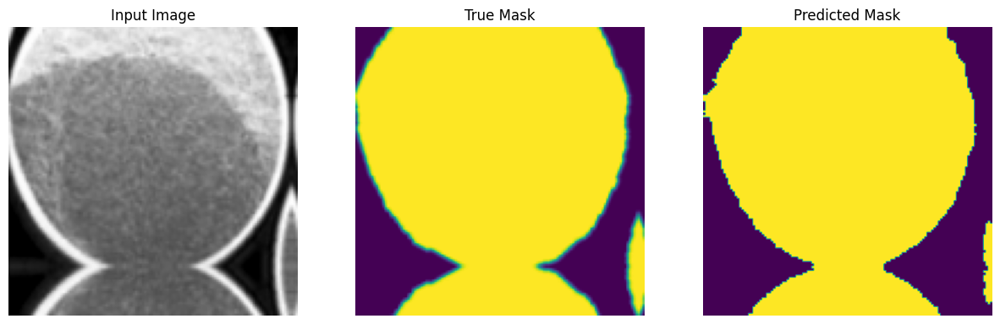


Sample Prediction after epoch 44

6/6 [==============================] - 3s 490ms/step - loss: 0.0683 - accuracy: 0.8780 - val_loss: 0.0927 - val_accuracy: 0.9669
Epoch 45/200
1/1 [==============================] - 0s 159ms/step


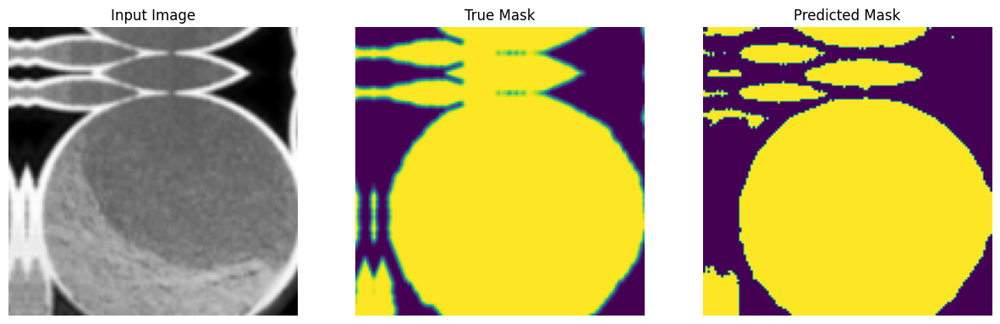


Sample Prediction after epoch 45

6/6 [==============================] - 3s 466ms/step - loss: 0.0702 - accuracy: 0.8684 - val_loss: 0.0771 - val_accuracy: 0.9704
Epoch 46/200
1/1 [==============================] - 0s 173ms/step


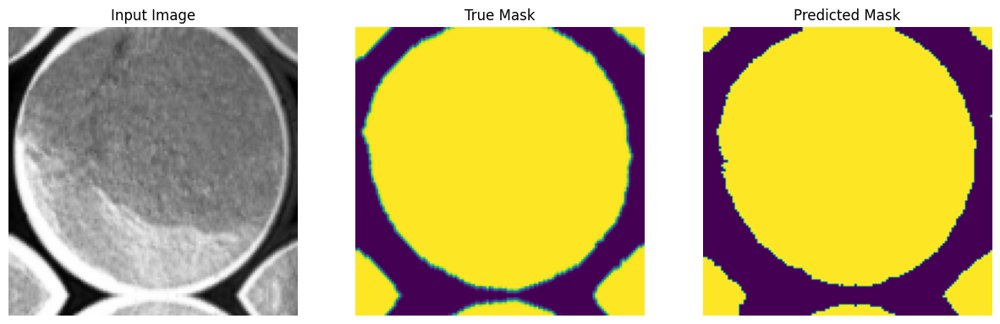


Sample Prediction after epoch 46

6/6 [==============================] - 3s 470ms/step - loss: 0.0667 - accuracy: 0.8704 - val_loss: 0.0816 - val_accuracy: 0.9692
Epoch 47/200
1/1 [==============================] - 0s 152ms/step


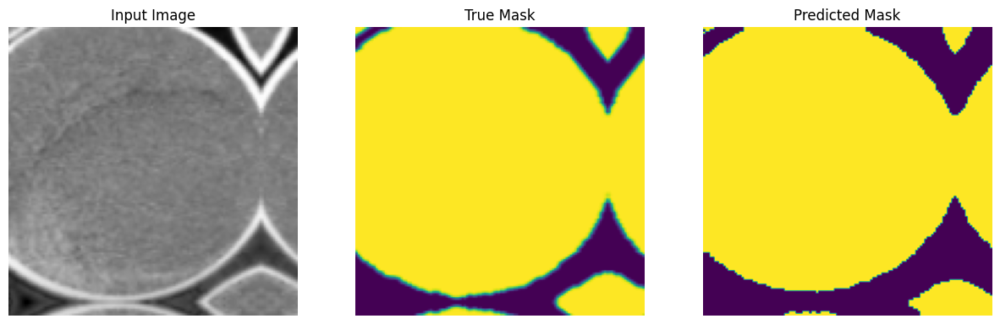


Sample Prediction after epoch 47

6/6 [==============================] - 3s 490ms/step - loss: 0.0630 - accuracy: 0.8800 - val_loss: 0.0929 - val_accuracy: 0.9659
Epoch 48/200
1/1 [==============================] - 0s 161ms/step


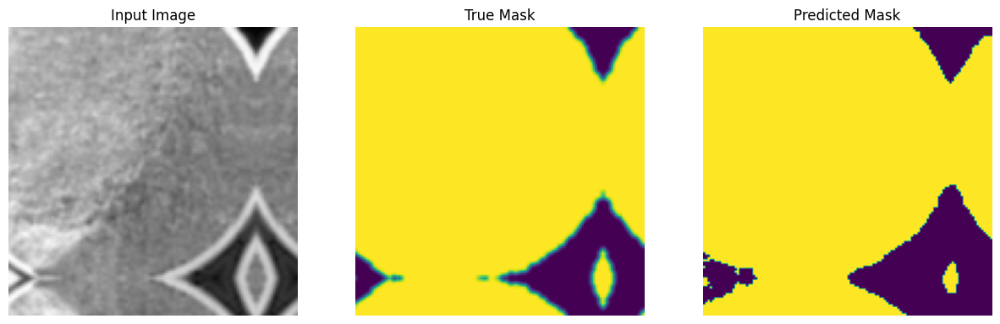


Sample Prediction after epoch 48

6/6 [==============================] - 3s 460ms/step - loss: 0.0685 - accuracy: 0.8718 - val_loss: 0.0964 - val_accuracy: 0.9650
Epoch 49/200
1/1 [==============================] - 0s 174ms/step


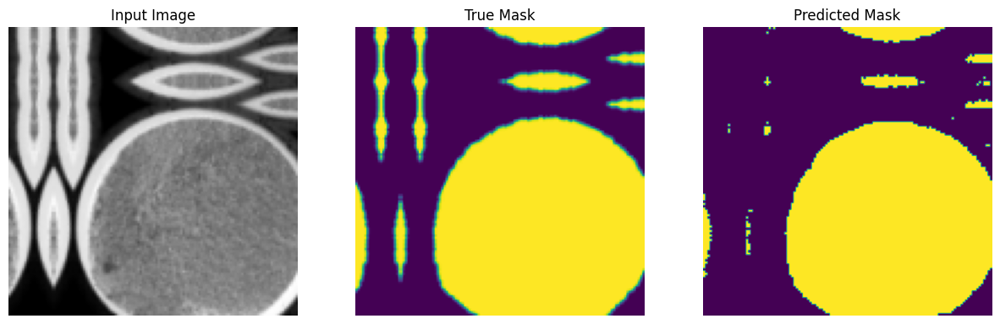


Sample Prediction after epoch 49

6/6 [==============================] - 3s 477ms/step - loss: 0.0618 - accuracy: 0.8737 - val_loss: 0.0882 - val_accuracy: 0.9674
Epoch 50/200
1/1 [==============================] - 0s 150ms/step


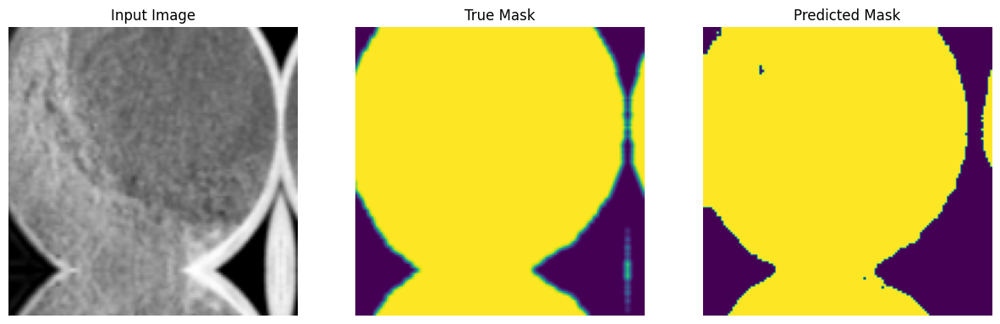


Sample Prediction after epoch 50

6/6 [==============================] - 3s 523ms/step - loss: 0.0630 - accuracy: 0.8726 - val_loss: 0.0949 - val_accuracy: 0.9650
Epoch 51/200
1/1 [==============================] - 0s 156ms/step


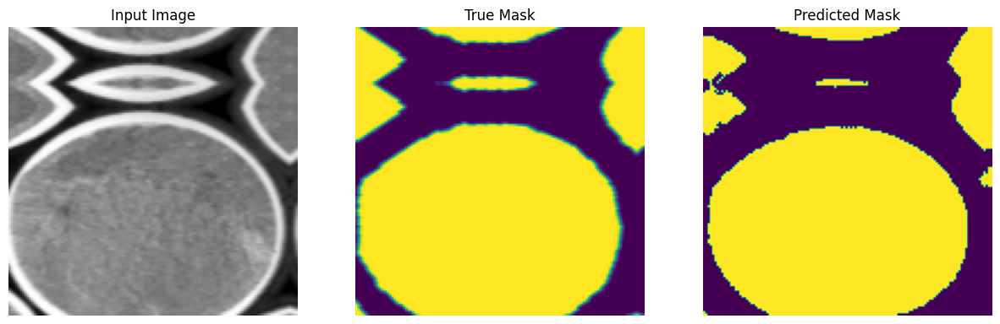


Sample Prediction after epoch 51

6/6 [==============================] - 3s 508ms/step - loss: 0.0623 - accuracy: 0.8722 - val_loss: 0.0812 - val_accuracy: 0.9688
Epoch 52/200
1/1 [==============================] - 0s 158ms/step


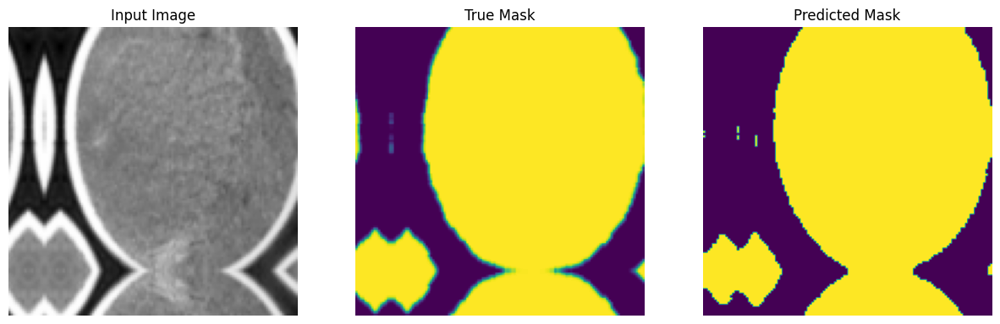


Sample Prediction after epoch 52

6/6 [==============================] - 3s 477ms/step - loss: 0.0634 - accuracy: 0.8751 - val_loss: 0.0909 - val_accuracy: 0.9669
Epoch 53/200
1/1 [==============================] - 0s 159ms/step


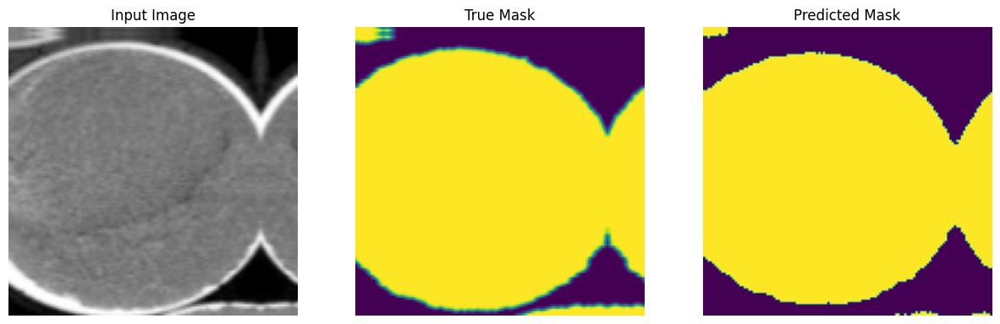


Sample Prediction after epoch 53

6/6 [==============================] - 3s 486ms/step - loss: 0.0611 - accuracy: 0.8777 - val_loss: 0.1084 - val_accuracy: 0.9619
Epoch 54/200
1/1 [==============================] - 0s 148ms/step


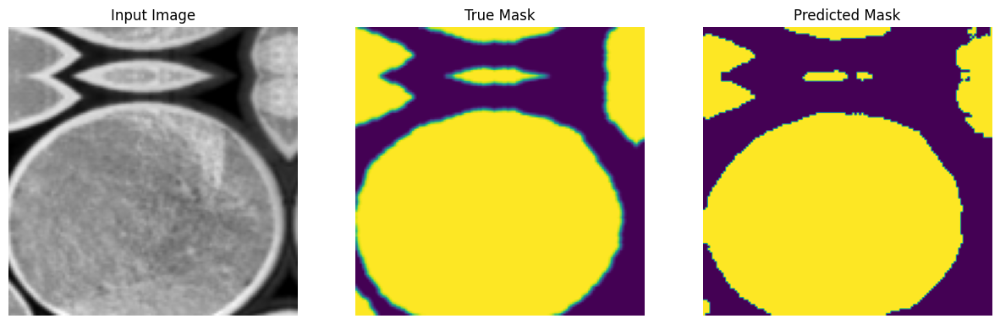


Sample Prediction after epoch 54

6/6 [==============================] - 3s 488ms/step - loss: 0.0627 - accuracy: 0.8802 - val_loss: 0.1150 - val_accuracy: 0.9604
Epoch 55/200
1/1 [==============================] - 0s 158ms/step


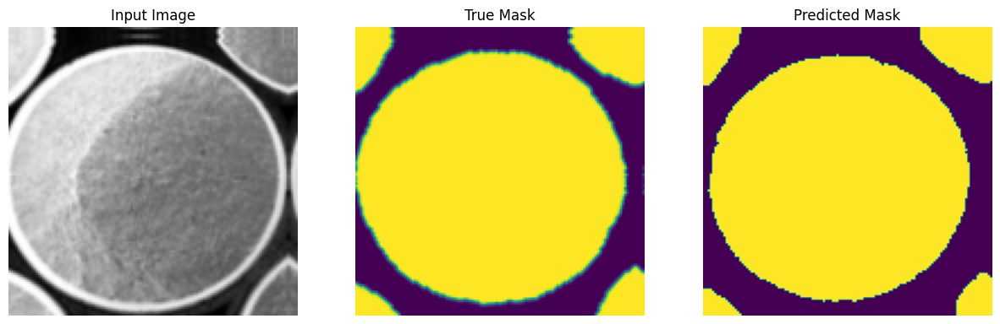


Sample Prediction after epoch 55

6/6 [==============================] - 3s 452ms/step - loss: 0.0601 - accuracy: 0.8740 - val_loss: 0.1073 - val_accuracy: 0.9629
Epoch 56/200
1/1 [==============================] - 0s 159ms/step


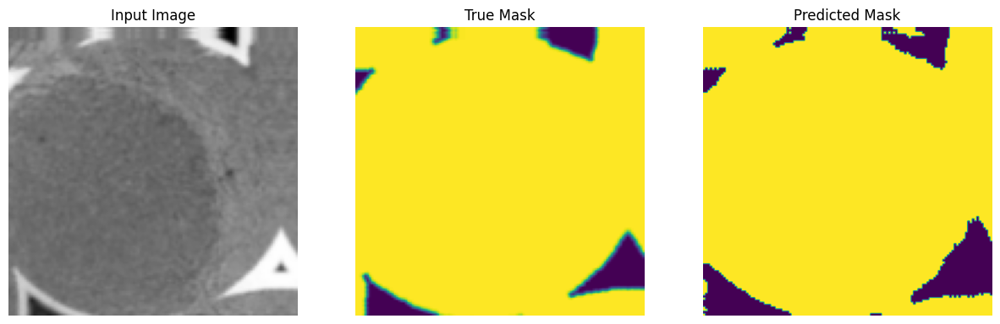


Sample Prediction after epoch 56

6/6 [==============================] - 3s 472ms/step - loss: 0.0648 - accuracy: 0.8779 - val_loss: 0.0906 - val_accuracy: 0.9666
Epoch 57/200
1/1 [==============================] - 0s 151ms/step


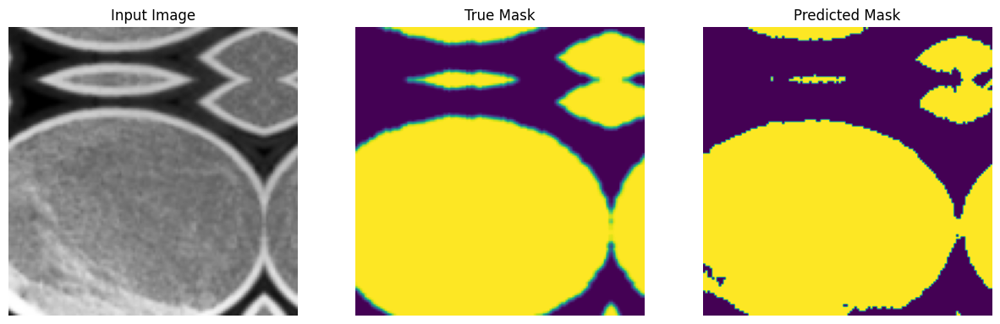


Sample Prediction after epoch 57

6/6 [==============================] - 3s 536ms/step - loss: 0.0599 - accuracy: 0.8805 - val_loss: 0.0911 - val_accuracy: 0.9666


In [60]:
from keras.callbacks import EarlyStopping
EPOCHS = 100
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(X_test)//BATCH_SIZE
STEPS_PER_EPOCH = len(X_train)//BATCH_SIZE

EPOCHS = 200
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(X_test) // BATCH_SIZE
STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE

early_stopping = EarlyStopping(
    monitor='val_loss',  # The metric to monitor (e.g., validation loss)
    patience=20,         # Number of epochs to wait without improvement
    restore_best_weights=True  # Restore the model to the best weights
)

model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches,
                          callbacks=[DisplayCallback(), early_stopping])

In [61]:
# evaluate the model
model.evaluate(test_batches, verbose=1)

2/2 [==============================] - 0s 92ms/step - loss: 0.0749 - accuracy: 0.9718


[0.07494625449180603, 0.9718393087387085]

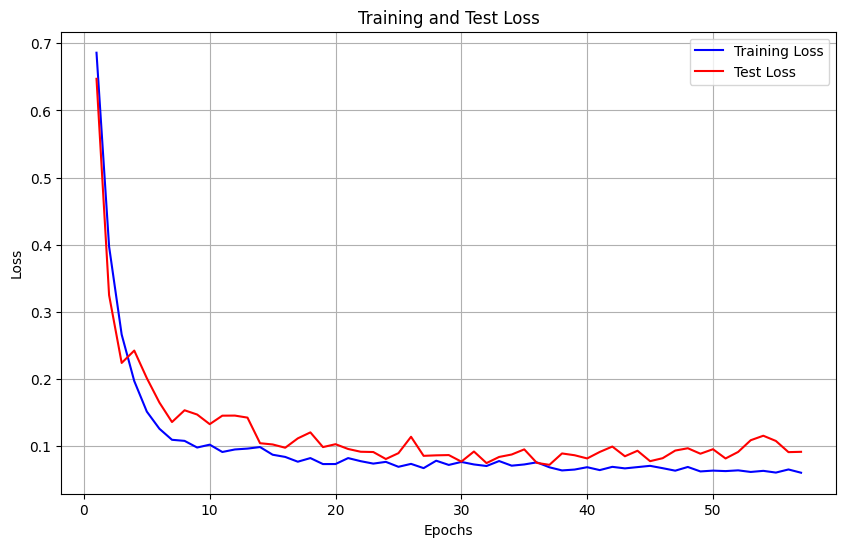

In [62]:
import matplotlib.pyplot as plt

# Extract data from the model history
train_loss = model_history.history['loss']
test_loss = model_history.history['val_loss']

# Create an array of the epoch numbers for the x-axis
epochs = range(1, len(train_loss) + 1)

# Plot the training loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, test_loss, 'r', label='Test Loss')
plt.title('Training and Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

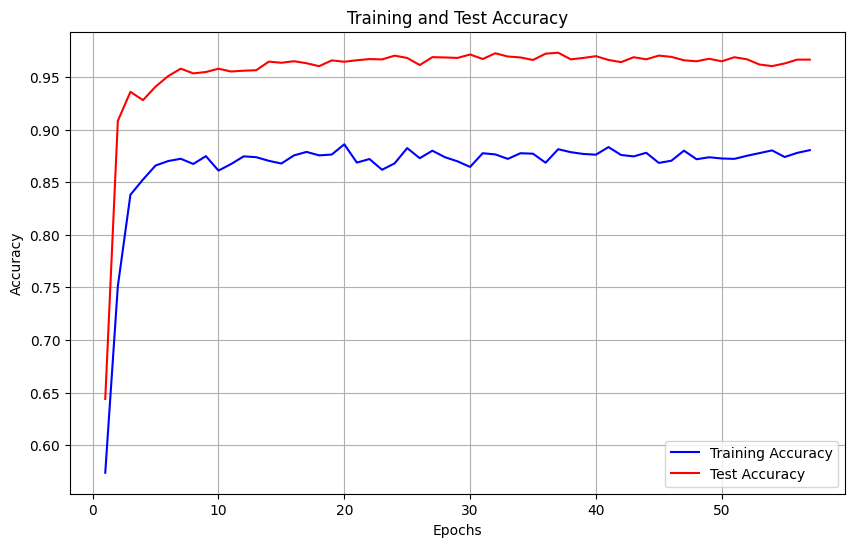

In [63]:
# Plot the training and testing accuracy
train_acc = model_history.history['accuracy']
test_acc = model_history.history['val_accuracy']

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_acc, 'b', label='Training Accuracy')
plt.plot(epochs, test_acc, 'r', label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()